In [1]:
import cv2
import glob
import os

In [2]:
def load_images_from_folder(folder_path):
  images = []
  image_extensions = ('*.png', '*.jpg', '*.jpeg')

  for ext in image_extensions:
    for filename in glob.glob(os.path.join(folder_path, ext)):
      # load to image matrix
      img = cv2.imread(filename)
      if img is not None:
        images.append(img)

  return images

In [3]:
female_dataset = load_images_from_folder('dataset/female')
male_dataset = load_images_from_folder('dataset/non-female')

In [8]:
import preprocessing as prep

In [35]:
def preprocess_image(image, face_detector_model):
  resized_img, scale = prep.resize_image(image, max_size=512)
  best_face = prep.detect_face(resized_img, face_detector_model)
  if best_face is None:
    print("No face detected, skipping")
    return None

  # get bounding box in resized image coordinates
  x_r, y_r, w_r, h_r = best_face[:4].astype(int)

  # map bounding box back to original image coordinates
  if scale != 1.0:
    x = int(x_r / scale)
    y = int(y_r / scale)
    w = int(w_r / scale)
    h = int(h_r / scale)
  else:
    x, y, w, h = x_r, y_r, w_r, h_r

  # filter faces by minimum size
  if w < 128 or h < 128:
    print(f"Image too small ({w}x{h}), skipping")
    return None

  cropped_face = prep.crop_face_square(image, x, y, w, h)
  if cropped_face.size == 0 or min(cropped_face.shape[:2]) < 32:
    print(f"Invalid crop, skipping")
    return None

  # preprocessings
  resized_face = prep.resize_to_128x128(cropped_face)
  gray_face = prep.convert_to_grayscale(resized_face)
  equalized_face = prep.apply_histogram_equalization(gray_face)

  confidence = best_face[14]
  print(f"Processed face (confidence: {confidence:.2f})")
  return equalized_face

In [ ]:
def process_images(images_data, face_detector_model):
  processed_faces = []

  for _, image in enumerate(images_data):
    face = preprocess_image(image, face_detector_model)

    if face is not None:
      processed_faces.append(face)

  return processed_faces

In [36]:
prep_female = process_images(female_dataset, prep.face_detector)
prep_male = process_images(male_dataset, prep.face_detector)

Processed face (confidence: 0.93)
Processed face (confidence: 0.92)
Processed face (confidence: 0.93)
Processed face (confidence: 0.92)
Processed face (confidence: 0.91)
Processed face (confidence: 0.89)
Processed face (confidence: 0.93)
Processed face (confidence: 0.92)
Processed face (confidence: 0.93)
Processed face (confidence: 0.93)
Processed face (confidence: 0.89)
Image too small (64x78), skipping
Processed face (confidence: 0.90)
Processed face (confidence: 0.90)
Processed face (confidence: 0.93)
Processed face (confidence: 0.90)
Processed face (confidence: 0.93)
Image too small (101x130), skipping
Processed face (confidence: 0.94)
Processed face (confidence: 0.91)
Processed face (confidence: 0.92)
Processed face (confidence: 0.92)
Processed face (confidence: 0.90)
Processed face (confidence: 0.93)
Processed face (confidence: 0.93)
Processed face (confidence: 0.93)
Processed face (confidence: 0.92)
Processed face (confidence: 0.92)
Processed face (confidence: 0.93)
Processed fa

In [14]:
import matplotlib.pyplot as plt

In [23]:
def display_processed_faces(processed_faces, title="Processed Faces"):
  num_faces = len(processed_faces)
  if num_faces > 0:
    print(f"\nTotal processed faces: {num_faces}")
    print(f"Face dimensions: {processed_faces[0].shape}")

    cols = min(4, num_faces)
    rows = (num_faces + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(12, 3*rows))
    axes = axes.flatten()

    for idx, face_gray in enumerate(processed_faces):
      axes[idx].imshow(face_gray, cmap='gray')
      axes[idx].axis('off')
      axes[idx].set_title(f'Face {idx+1}', fontsize=11)

    if num_faces > 1:
      for idx in range(num_faces, len(axes)):
        axes[idx].axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make space for suptitle
    plt.show()
  else:
    print(f"No faces to display for {title}!")


Total processed faces: 121
Face dimensions: (128, 128)


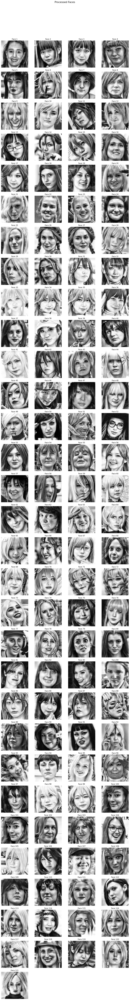


Total processed faces: 110
Face dimensions: (128, 128)


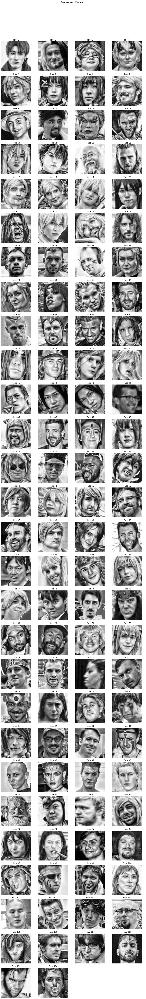

In [24]:
display_processed_faces(prep_female)
display_processed_faces(prep_male)

In [15]:
import numpy as np
import feature_extraction as feat

In [37]:
def extract_features(image):
  hog_features = feat.extract_hog_features(image).astype(np.float32)
  mblbp_features = feat.extract_mblbp_features(image).astype(np.float32)
  return np.concatenate([hog_features, mblbp_features])

In [38]:
X = []
y = []

for image in prep_female:
  fv = extract_features(image)
  X.append(fv)
  y.append("female")

for image in prep_male:
  fv = extract_features(image)
  X.append(fv)
  y.append("male")

X = np.array(X)
y = np.array(y)

In [39]:
print(f"Shape of X (features): {X.shape}")
print(f"Shape of y (labels): {y.shape}")

print("\n")
for i in range(min(5, len(X))):
  print(f"Sample {i+1} - Label: {y[i]}, Features (first 10 elements): {X[i][:10]}")

Shape of X (features): (231, 1824)
Shape of y (labels): (231,)


Sample 1 - Label: female, Features (first 10 elements): [0.17344473 0.09941528 0.04925742 0.04260077 0.09655626 0.02659249
 0.03992074 0.03497075 0.36074907 0.36074907]
Sample 2 - Label: female, Features (first 10 elements): [0.26170924 0.17843373 0.01916132 0.00575821 0.05112596 0.00489378
 0.01921323 0.3137987  0.3137987  0.3137987 ]
Sample 3 - Label: female, Features (first 10 elements): [0.2836546  0.2836546  0.16346747 0.05198114 0.05919978 0.04138856
 0.03580144 0.12959631 0.2836546  0.2836546 ]
Sample 4 - Label: female, Features (first 10 elements): [0.2858925  0.2858925  0.17702907 0.10685955 0.08144944 0.05605493
 0.02290242 0.07434414 0.2858925  0.2858925 ]
Sample 5 - Label: female, Features (first 10 elements): [0.11148802 0.08815894 0.10106219 0.28134346 0.19829442 0.02215331
 0.01872067 0.02030058 0.2515567  0.2868151 ]


In [22]:
# simpankan dulu le, buat dipake inferensi
np.savez("gender_features_v2.npz", X=X, y=y)

In [19]:
import knn

In [40]:
k_values = range(1, 31, 2)
mean_accuracies = []

for k in k_values:
  model = knn.KNN(k)
  model.fit(X, y)

  preds, scores = model.loocv()
  mean_acc = np.mean(scores)
  mean_accuracies.append(mean_acc)
  
  print(f"K={k:2d} | Mean LOOCV Accuracy = {mean_acc:.4f}")

# Ambil K terbaik
best_k = k_values[np.argmax(mean_accuracies)]
best_acc = max(mean_accuracies)

print("\n🎉 Best K Found!")
print(f"Best K = {best_k}")
print(f"Best LOOCV Accuracy = {best_acc:.4f}")

LOOCV Accuracy: 63.64% (147/231)
K= 1 | Mean LOOCV Accuracy = 63.6364
LOOCV Accuracy: 67.97% (157/231)
K= 3 | Mean LOOCV Accuracy = 67.9654
LOOCV Accuracy: 70.56% (163/231)
K= 5 | Mean LOOCV Accuracy = 70.5628
LOOCV Accuracy: 71.00% (164/231)
K= 7 | Mean LOOCV Accuracy = 70.9957
LOOCV Accuracy: 72.73% (168/231)
K= 9 | Mean LOOCV Accuracy = 72.7273
LOOCV Accuracy: 70.56% (163/231)
K=11 | Mean LOOCV Accuracy = 70.5628
LOOCV Accuracy: 71.00% (164/231)
K=13 | Mean LOOCV Accuracy = 70.9957
LOOCV Accuracy: 73.59% (170/231)
K=15 | Mean LOOCV Accuracy = 73.5931
LOOCV Accuracy: 73.59% (170/231)
K=17 | Mean LOOCV Accuracy = 73.5931
LOOCV Accuracy: 73.59% (170/231)
K=19 | Mean LOOCV Accuracy = 73.5931
LOOCV Accuracy: 74.89% (173/231)
K=21 | Mean LOOCV Accuracy = 74.8918
LOOCV Accuracy: 72.73% (168/231)
K=23 | Mean LOOCV Accuracy = 72.7273
LOOCV Accuracy: 71.43% (165/231)
K=25 | Mean LOOCV Accuracy = 71.4286
LOOCV Accuracy: 72.29% (167/231)
K=27 | Mean LOOCV Accuracy = 72.2944
LOOCV Accuracy: 72.2

In [52]:
model = knn.KNN(k=17)
model.fit(X, y)
preds, accuracy = model.loocv()

LOOCV Accuracy: 73.59% (170/231)
